In [ ]:
from pathlib import Path

import arviz as az
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from numpy.random import default_rng
import pandas as pd
import pymc as pm
import xarray as xr
import geopandas as gpd

from patsy import dmatrix

from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import FunctionTransformer, OneHotEncoder, StandardScaler
from sklearn.gaussian_process.kernels import RBF

import math
from scipy.stats import gamma

def convert_float64(X):
    return X.astype(np.float64)

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"

RANDOM_SEED = 8927
az.style.use("arviz-darkgrid")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Data Visualization and Preprocessing

In [ ]:
st_pete_property_df = pd.read_csv('/content/drive/MyDrive/why_people_stay/zillow_parcel_census_coast_flood_st_pete.csv', index_col=0)

In [ ]:
st_pete_property_df.columns

Index(['zpid', 'streetAddress', 'zipcode', 'city', 'state', 'latitude',
       'longitude', 'price', 'bathrooms', 'bedrooms', 'livingArea',
       'YEAR_BUILT', 'EFFECTIVE_AGE', 'COOLING', 'HEATING', 'POOL', 'TENNIS',
       'CONTAMINATION_YN', 'EVAC_ZONE', 'WATERFRONT_YN', 'SEAWALL', 'geometry',
       'GEOID', 'hhinc_k', 'flood_risk', 'MC_std', 'dist2coast',
       'grocery_access'],
      dtype='object')

In [ ]:
st_pete_property_df['lg_price'] = np.log10(st_pete_property_df.price)
st_pete_property_df['dist2coast_km'] = st_pete_property_df['dist2coast']/1000

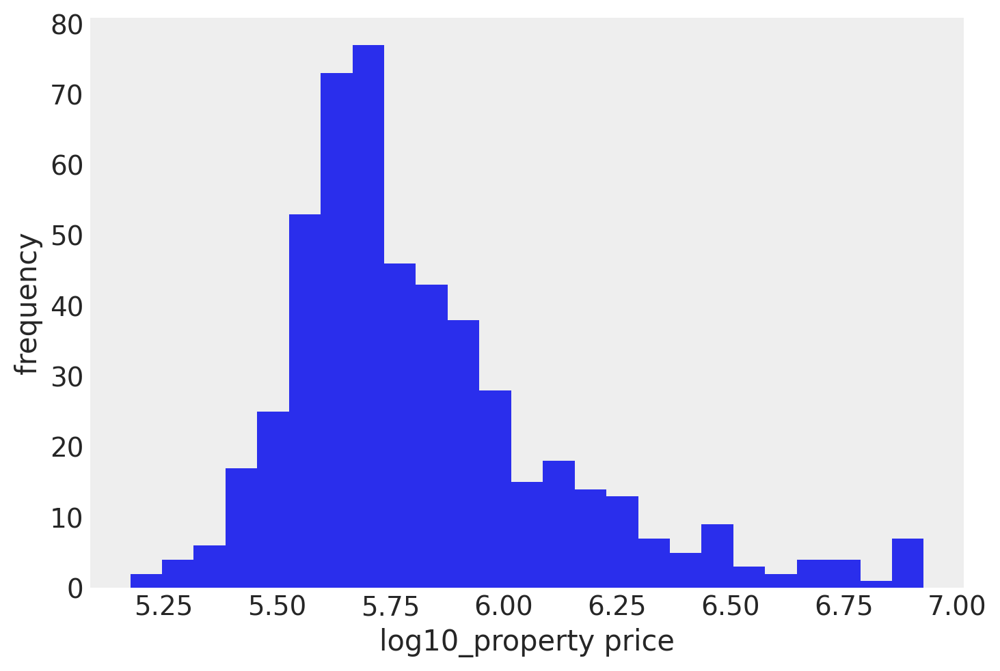

In [ ]:
st_pete_property_df.lg_price.hist(bins=25, grid=False)
plt.xlabel("log10_property price")
plt.ylabel("frequency");

In [ ]:
tract_idx, tracts = st_pete_property_df.GEOID.factorize()
st_pete_property_df['tract_idx'] = tract_idx

In [ ]:
# ['lg_price', 'bathrooms', 'livingArea', 'POOL', 'hhinc_k', 'flood_risk', 'dist2coast_km']
# ['lg_price', 'bathrooms', 'livingArea', 'POOL', 'EVAC_ZONE', 'hhinc_k', 'dist2coast_km']
st_pete_property_mod = st_pete_property_df[[
                                          'lg_price', 'bathrooms', 'livingArea', 'POOL', 'EVAC_ZONE', 'hhinc_k', 'flood_risk', 'dist2coast_km', 'WATERFRONT_YN',
                                          'tract_idx', 'latitude', 'longitude']].dropna().reset_index(drop=True)

In [ ]:
st_pete_property_mod['EVAC_ZONE'] = st_pete_property_mod['EVAC_ZONE'].str.strip().str.upper()
st_pete_property_mod['flood_zone'] = st_pete_property_mod['EVAC_ZONE'].apply(
                                                                                    lambda x: x if x in ['A', 'NON EVAC'] else 'Other'
                                                                                    )


In [ ]:
st_pete_property_mod.flood_zone.value_counts()

,count
flood_zone,
A,171
NON EVAC,155
Other,152


In [ ]:
numerical_columns = ['bathrooms', 'livingArea', 'hhinc_k', 'flood_risk', 'dist2coast_km']
numerical_pipeline = make_pipeline(
    FunctionTransformer(func=convert_float64, validate=False),
    StandardScaler()
)

categorical_columns = ['flood_zone', 'POOL', 'WATERFRONT_YN']
categorical_pipeline = make_pipeline(
    OneHotEncoder(categories="auto"),
)

preprocessor = ColumnTransformer(
    [
        ("numerical_preprocessing", numerical_pipeline, numerical_columns),
        ("categorical_preprocessing", categorical_pipeline, categorical_columns),
    ],
)

In [ ]:
st_pete_property_mod.columns

Index(['lg_price', 'bathrooms', 'livingArea', 'POOL', 'EVAC_ZONE', 'hhinc_k',
       'flood_risk', 'dist2coast_km', 'WATERFRONT_YN', 'tract_idx', 'latitude',
       'longitude', 'flood_zone'],
      dtype='object')

In [ ]:
X = st_pete_property_mod[['bathrooms', 'livingArea', 'POOL', 'hhinc_k', 'flood_risk', 'dist2coast_km', 'WATERFRONT_YN', 'flood_zone']].reset_index(drop=True)
Y = st_pete_property_mod[st_pete_property_mod.columns[0]].reset_index(drop=True)

In [ ]:
# Fit the preprocessor first
preprocessor.fit(X)

# Extract feature names for numerical columns
numerical_feature_names = numerical_columns

# Extract feature names for categorical columns using the OneHotEncoder step
categorical_feature_names = (
    preprocessor.named_transformers_['categorical_preprocessing']
    .named_steps['onehotencoder']
    .get_feature_names_out(categorical_columns)
)

# Combine both numerical and categorical feature names
all_feature_names = np.concatenate([numerical_feature_names, categorical_feature_names])

# Display the feature names
print("Feature Names After Transformation:")
print(all_feature_names)


Feature Names After Transformation:
['bathrooms' 'livingArea' 'hhinc_k' 'flood_risk' 'dist2coast_km'
 'flood_zone_A' 'flood_zone_NON EVAC' 'flood_zone_Other' 'POOL_N' 'POOL_Y'
 'WATERFRONT_YN_N' 'WATERFRONT_YN_Y']


In [ ]:
bathrooms = preprocessor.transform(X)[:,0]
livingArea = preprocessor.transform(X)[:,1]
hhinc_k = preprocessor.transform(X)[:,2]
flood_risk = preprocessor.transform(X)[:,3]
dist2coast_km = preprocessor.transform(X)[:,4]
ZONE_A = preprocessor.transform(X)[:,5]
ZONE_other = preprocessor.transform(X)[:,7]
# ZONE_B = preprocessor.transform(X)[:,6]
# ZONE_C = preprocessor.transform(X)[:,7]
# ZONE_D = preprocessor.transform(X)[:,8]
# ZONE_E = preprocessor.transform(X)[:,9]
POOL = preprocessor.transform(X)[:,9]
WATERFRONT = preprocessor.transform(X)[:,11]
tract_idx = st_pete_property_mod.tract_idx.values

In [ ]:
np.quantile(flood_risk, np.linspace(0, 1, 5))

array([-0.7838397 , -0.78114287, -0.65025424,  1.11439334,  1.75916418])

## Model Comparison

### Base Model -- Model without any flood risk component

In [ ]:
with pm.Model() as base_model:
    sigma = pm.HalfCauchy("sigma", beta=10)
    intercept = pm.Normal("Intercept", 0, sigma=1)
    bathrooms_slope = pm.Normal("bathrooms_slope", 0, sigma=1)
    livingArea_slope = pm.Normal("livingArea_slope", 0, sigma=1)
    POOL_slope = pm.Normal("POOL_slope", 0, sigma=1)

    hhinc_k_slope = pm.Normal("hhinc_k_slope", 0, sigma=1)

    dist2coast_km_slope = pm.Normal("dist2coast_km_slope", 0, sigma=1)
    # WATERFRONT_slope = pm.Normal("WATERFRONT_slope", 0, sigma=1)

    likelihood = pm.LogNormal("y",
                              mu= intercept + \
                                  bathrooms_slope*bathrooms + \
                                  livingArea_slope*livingArea + \
                                  POOL_slope*POOL + \
                                  hhinc_k_slope*hhinc_k + \
                                  dist2coast_km_slope*dist2coast_km,
                              sigma=sigma,
                              observed=Y)

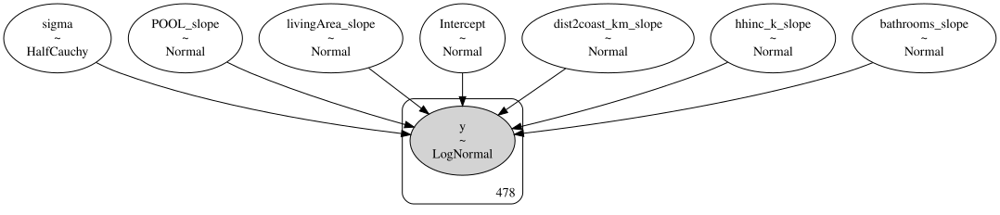

In [ ]:
pm.model_to_graphviz(base_model)

In [ ]:
with base_model:
    idata_base = pm.sample_prior_predictive()
    idata_base.extend(pm.sample(draws=1000, tune=1000, random_seed=RANDOM_SEED, chains=4))
    pm.sample_posterior_predictive(idata_base, extend_inferencedata=True)

Output()

Output()

In [ ]:
# /content/drive/MyDrive/why_people_stay/pymc_model_experiments
idata_base.to_netcdf('/content/drive/MyDrive/why_people_stay/pymc_model_experiments/base03222025.nc')

'/content/drive/MyDrive/why_people_stay/pymc_model_experiments/base04192025.nc'

In [ ]:
idata_base = az.from_netcdf('/content/drive/MyDrive/why_people_stay/pymc_model_experiments/base03222025.nc')

In [ ]:
az.summary(idata_base)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,1.754,0.001,1.751,1.756,0.0,0.0,2869.0,2970.0,1.0
POOL_slope,0.014,0.003,0.009,0.019,0.0,0.0,2784.0,2678.0,1.0
bathrooms_slope,0.009,0.002,0.004,0.013,0.0,0.0,2477.0,2618.0,1.0
dist2coast_km_slope,-0.006,0.001,-0.008,-0.003,0.0,0.0,3435.0,2851.0,1.0
hhinc_k_slope,0.008,0.001,0.006,0.011,0.0,0.0,3044.0,2334.0,1.0
livingArea_slope,0.028,0.002,0.023,0.032,0.0,0.0,2343.0,2542.0,1.0
sigma,0.024,0.001,0.023,0.025,0.0,0.0,5012.0,3320.0,1.0


In [ ]:
az.extract(idata_base)

<xarray.Dataset> Size: 320kB
Dimensions:              (sample: 4000)
Coordinates:
  * sample               (sample) object 32kB MultiIndex
  * chain                (sample) int64 32kB 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3
  * draw                 (sample) int64 32kB 0 1 2 3 4 5 ... 995 996 997 998 999
Data variables:
    Intercept            (sample) float64 32kB 1.752 1.755 1.754 ... 1.754 1.752
    POOL_slope           (sample) float64 32kB 0.01457 0.01292 ... 0.01493
    bathrooms_slope      (sample) float64 32kB 0.01123 0.009349 ... 0.01138
    dist2coast_km_slope  (sample) float64 32kB -0.005522 -0.005221 ... -0.006706
    hhinc_k_slope        (sample) float64 32kB 0.0082 0.009818 ... 0.00726
    livingArea_slope     (sample) float64 32kB 0.02552 0.02692 ... 0.02603
    sigma                (sample) float64 32kB 0.02304 0.02446 ... 0.02418
Attributes:
    created_at:                 2025-03-22T21:45:48.582451+00:00
    arviz_version:              0.21.0
    inference_library:          pymc
    inference_library_version:  5.21.1
    sampling_time:              15.398221492767334
    tuning_steps:               1000

In [ ]:
idata_base.posterior_predictive

<xarray.Dataset> Size: 15MB
Dimensions:  (chain: 4, draw: 1000, y_dim_0: 478)
Coordinates:
  * chain    (chain) int64 32B 0 1 2 3
  * draw     (draw) int64 8kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
  * y_dim_0  (y_dim_0) int64 4kB 0 1 2 3 4 5 6 7 ... 471 472 473 474 475 476 477
Data variables:
    y        (chain, draw, y_dim_0) float64 15MB ...
Attributes:
    created_at:                 2025-03-22T21:45:49.197474+00:00
    arviz_version:              0.21.0
    inference_library:          pymc
    inference_library_version:  5.21.1

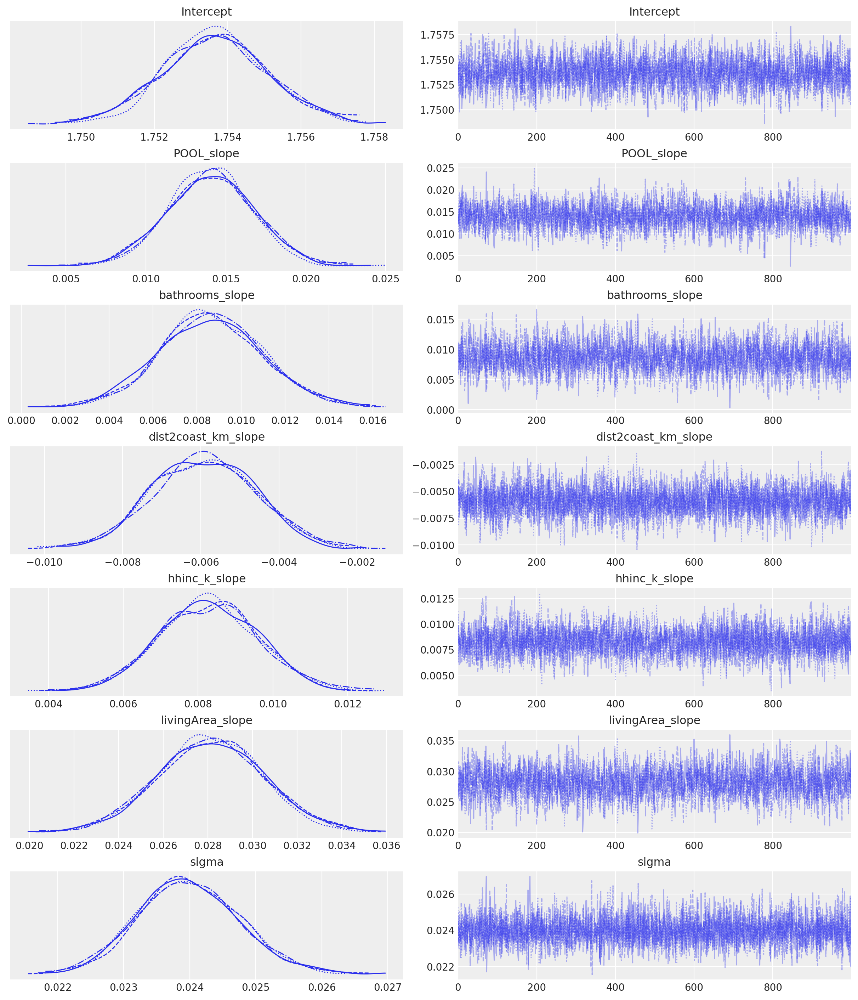

In [ ]:
az.plot_trace(idata_base);

<Axes: xlabel='y'>

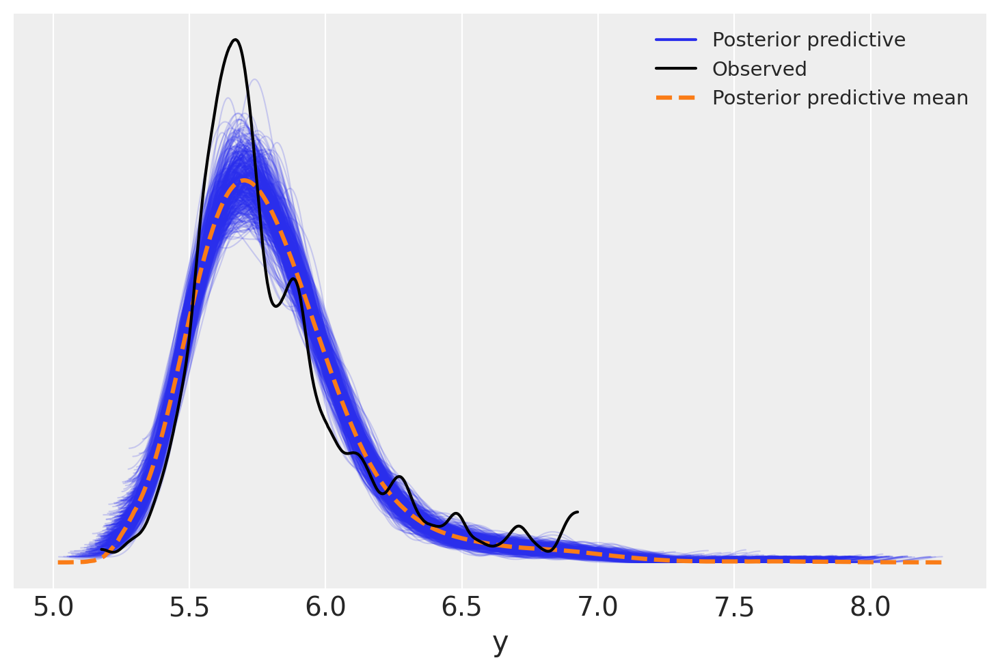

In [ ]:
az.plot_ppc(idata_base, num_pp_samples=500)

### Model with Flood Zone

In [ ]:
with pm.Model() as fld_zone_model:
    sigma = pm.HalfCauchy("sigma", beta=10)
    intercept = pm.Normal("Intercept", 0, sigma=1)
    bathrooms_slope = pm.Normal("bathrooms_slope", 0, sigma=1)
    livingArea_slope = pm.Normal("livingArea_slope", 0, sigma=1)
    POOL_slope = pm.Normal("POOL_slope", 0, sigma=1)

    hhinc_k_slope = pm.Normal("hhinc_k_slope", 0, sigma=1)

    dist2coast_km_slope = pm.Normal("dist2coast_km_slope", 0, sigma=1)
    # WATERFRONT_slope = pm.Normal("WATERFRONT_slope", 0, sigma=1)

    ZONE_A_slope = pm.Normal("ZONE_A_slope", 0, sigma=1)
    ZONE_other_slope = pm.Normal("ZONE_other_slope", 0, sigma=1)


    likelihood = pm.LogNormal("y",
                              mu =intercept + \
                                  bathrooms_slope*bathrooms + \
                                  livingArea_slope*livingArea + \
                                  POOL_slope*POOL + \
                                  hhinc_k_slope*hhinc_k + \
                                  dist2coast_km_slope*dist2coast_km + \
                                  # WATERFRONT_slope*WATERFRONT + \
                                  ZONE_A_slope*ZONE_A + \
                                  ZONE_other_slope*ZONE_other,
                              sigma=sigma,
                              observed=Y)

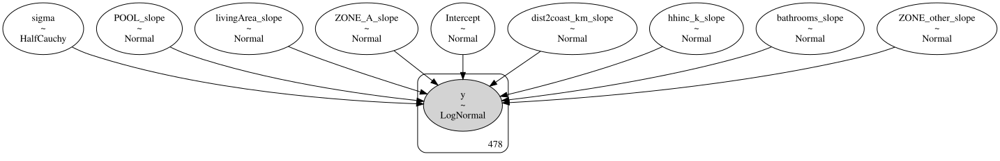

In [ ]:
pm.model_to_graphviz(fld_zone_model)

In [ ]:
with fld_zone_model:
    idata_fld_zone = pm.sample_prior_predictive()
    idata_fld_zone.extend(pm.sample(draws=1000, tune=1000, random_seed=RANDOM_SEED, chains=4))
    pm.sample_posterior_predictive(idata_fld_zone, extend_inferencedata=True)

Output()

Output()

In [ ]:
# /content/drive/MyDrive/why_people_stay/pymc_model_experiments
idata_fld_zone.to_netcdf('/content/drive/MyDrive/why_people_stay/pymc_model_experiments/fld_zone04082025.nc')

In [ ]:
idata_fld_zone = az.from_netcdf('/content/drive/MyDrive/why_people_stay/pymc_model_experiments/fld_zone04082025.nc')

In [ ]:
az.summary(idata_fld_zone)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,1.757,0.003,1.753,1.762,0.0,0.0,2306.0,2303.0,1.0
POOL_slope,0.015,0.003,0.010,0.020,0.0,0.0,3741.0,2780.0,1.0
ZONE_A_slope,-0.005,0.005,-0.014,0.003,0.0,0.0,2346.0,2308.0,1.0
ZONE_other_slope,-0.008,0.003,-0.013,-0.002,0.0,0.0,2875.0,2891.0,1.0
bathrooms_slope,0.009,0.002,0.004,0.013,0.0,0.0,3048.0,3007.0,1.0
dist2coast_km_slope,-0.007,0.002,-0.010,-0.004,0.0,0.0,3223.0,3126.0,1.0
hhinc_k_slope,0.008,0.002,0.005,0.011,0.0,0.0,3221.0,3280.0,1.0
livingArea_slope,0.028,0.002,0.023,0.032,0.0,0.0,3060.0,3049.0,1.0
sigma,0.024,0.001,0.022,0.025,0.0,0.0,4030.0,2890.0,1.0


<Axes: xlabel='y'>

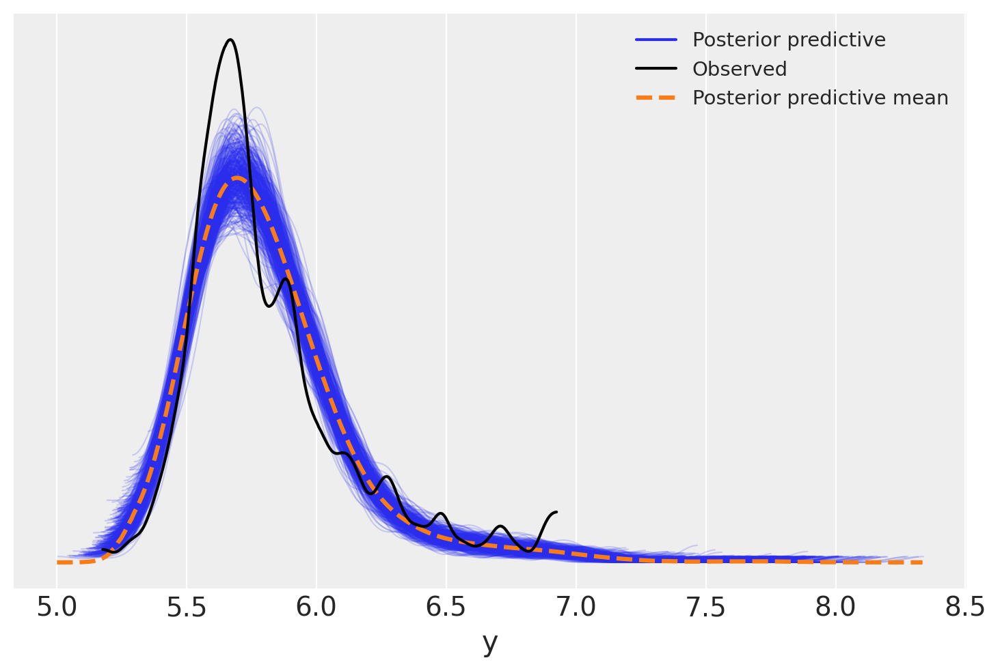

In [ ]:
az.plot_ppc(idata_fld_zone, num_pp_samples=500)

### Gaussian Process for Flood Risk Effect

<ipython-input-65-fc673610e8fa>:20: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


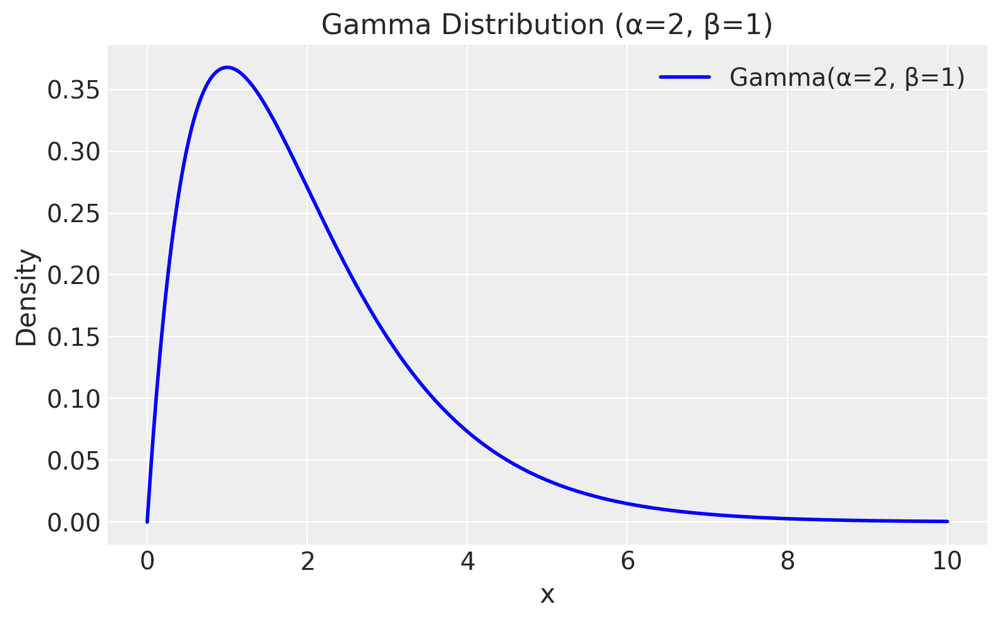

In [ ]:
# Parameters
alpha = 2
beta = 1
scale = 1 / beta  # scipy uses scale = 1 / rate

# x range
x = np.linspace(0, 10, 500)

# PDF
pdf = gamma.pdf(x, a=alpha, scale=scale)

# Plot
plt.figure(figsize=(8, 5))
plt.plot(x, pdf, color='blue', linewidth=2, label=f'Gamma(α={alpha}, β={beta})')
plt.title('Gamma Distribution (α=2, β=1)')
plt.xlabel('x')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
def exp_quad_kernel(x, knots, ℓ=1):
    """exponentiated quadratic kernel"""
    return np.array([np.exp(-(x-k)**2 / (2*ℓ**2)) for k in knots])

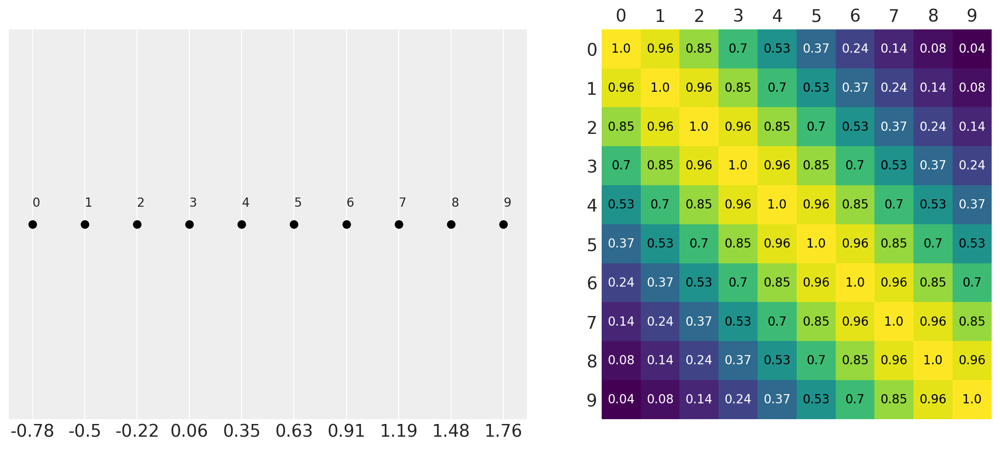

In [ ]:
data = np.linspace(-0.7838397, 1.75916418, 10)  # np.random.normal(size=4)
cov = exp_quad_kernel(data, data, 1)

_, ax = plt.subplots(1, 2, figsize=(12, 5))
ax = np.ravel(ax)

ax[0].plot(data, np.zeros_like(data), 'ko')
ax[0].set_yticks([])
for idx, i in enumerate(data):
    ax[0].text(i, 0+0.005, idx)
ax[0].set_xticks(data)
ax[0].set_xticklabels(np.round(data, 2))
#ax[0].set_xticklabels(np.round(data, 2), rotation=70)

ax[1].grid(False)
im = ax[1].imshow(cov)
colors = ['w', 'k']
for i in range(len(cov)):
    for j in range(len(cov)):
        ax[1].text(j, i, round(cov[i, j], 2),
                   color=colors[int(im.norm(cov[i, j]) > 0.5)],
                   ha='center', va='center', fontdict={'size': 10})
ax[1].set_xticks(range(len(data)))
ax[1].set_yticks(range(len(data)))
ax[1].xaxis.tick_top()
plt.savefig('B11197_07_02.png')

<ipython-input-68-c3e340e3bf9d>:25: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


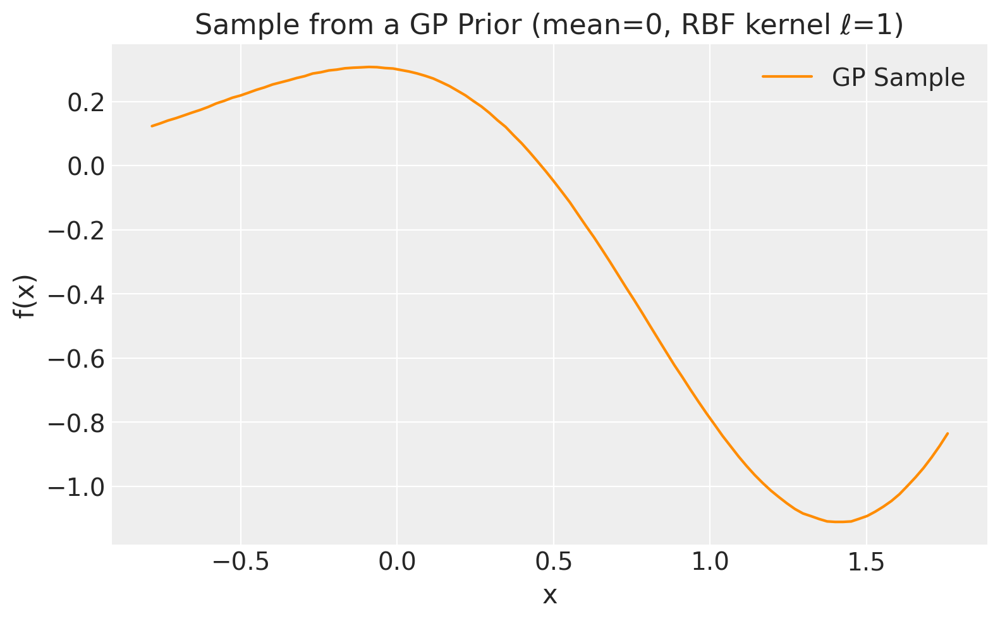

In [ ]:
# Define input locations
X = np.linspace(-0.7838397, 1.75916418, 100).reshape(-1, 1)

# Define RBF kernel with length scale = 1
kernel = RBF(length_scale=1.0)

# Compute the covariance matrix
K = kernel(X)

# Add a tiny noise for numerical stability
K += 1e-6 * np.eye(len(X))

# Sample from the multivariate normal
rng = default_rng(42)
y_sample = rng.multivariate_normal(mean=np.zeros(len(X)), cov=K)

# Plot
plt.figure(figsize=(8, 5))
plt.plot(X, y_sample, label='GP Sample', color='darkorange')
plt.title("Sample from a GP Prior (mean=0, RBF kernel ℓ=1)")
plt.xlabel("x")
plt.ylabel("f(x)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
with pm.Model() as gaussian_model:
    sigma = pm.HalfCauchy("sigma", beta=10)
    intercept = pm.Normal("Intercept", 0, sigma=1)
    bathrooms_slope = pm.Normal("bathrooms_slope", 0, sigma=1)
    livingArea_slope = pm.Normal("livingArea_slope", 0, sigma=1)
    POOL_slope = pm.Normal("POOL_slope", 0, sigma=1)

    hhinc_k_slope = pm.Normal("hhinc_k_slope", 0, sigma=1)

    dist2coast_km_slope = pm.Normal("dist2coast_km_slope", 0, sigma=1)
    # WATERFRONT_slope = pm.Normal("WATERFRONT_slope", 0, sigma=1)

    # add flood risk component
    ell = pm.Gamma("ell", alpha=2, beta=1)
    eta = pm.HalfNormal("eta", sigma=5)

    cov = eta**2 * pm.gp.cov.ExpQuad(1, ell)
    gp = pm.gp.Latent(cov_func=cov)

    f = gp.prior("f", X=flood_risk.reshape(-1, 1))


    likelihood = pm.LogNormal("y",
                              mu= intercept + \
                                  bathrooms_slope*bathrooms + \
                                  livingArea_slope*livingArea + \
                                  POOL_slope*POOL + \
                                  hhinc_k_slope*hhinc_k + \
                                  dist2coast_km_slope*dist2coast_km + \
                                  # WATERFRONT_slope*WATERFRONT + \
                                  f,
                              sigma=sigma,
                              observed=Y)

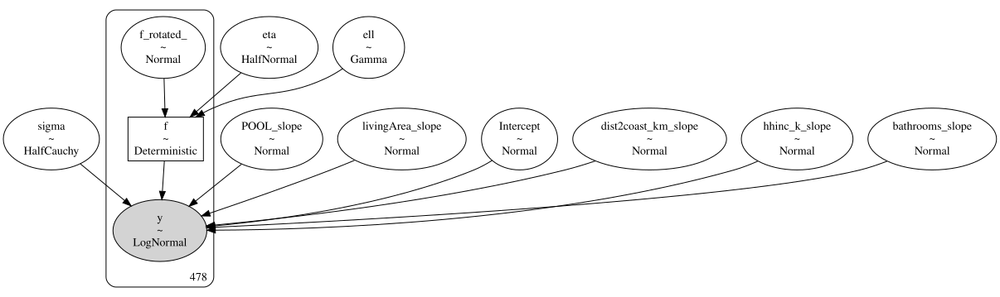

In [ ]:
pm.model_to_graphviz(gaussian_model)

In [ ]:
with gaussian_model:
    idata_gaussian = pm.sample_prior_predictive()
    idata_gaussian.extend(pm.sample(draws=1000, tune=1000, random_seed=RANDOM_SEED, chains=2))
    pm.sample_posterior_predictive(idata_gaussian, extend_inferencedata=True)

In [ ]:
# /content/drive/MyDrive/why_people_stay/pymc_model_experiments
idata_gaussian.to_netcdf('/content/drive/MyDrive/why_people_stay/pymc_model_experiments/gaussian03262025.nc')

In [ ]:
idata_gaussian = az.from_netcdf('/content/drive/MyDrive/why_people_stay/pymc_model_experiments/gaussian03262025.nc')

In [ ]:
az.summary(idata_gaussian, var_names="dist2coast_km_slope")

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
dist2coast_km_slope,-0.007,0.001,-0.009,-0.004,0.0,0.0,1925.0,1457.0,1.0


In [ ]:
az.summary(idata_gaussian, var_names="f")

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
f[0],0.001,0.004,-0.005,0.008,0.0,0.0,669.0,1161.0,1.0
f[1],0.002,0.004,-0.004,0.009,0.0,0.0,768.0,1335.0,1.0
f[2],-0.008,0.004,-0.015,0.001,0.0,0.0,1415.0,1644.0,1.0
f[3],-0.011,0.009,-0.027,0.008,0.0,0.0,2204.0,1361.0,1.0
f[4],-0.002,0.005,-0.011,0.007,0.0,0.0,1468.0,1723.0,1.0
...,...,...,...,...,...,...,...,...,...
f[473],-0.005,0.004,-0.014,0.003,0.0,0.0,1473.0,1601.0,1.0
f[474],-0.001,0.008,-0.017,0.015,0.0,0.0,2320.0,1148.0,1.0
f[475],-0.033,0.006,-0.043,-0.022,0.0,0.0,1274.0,1550.0,1.0
f[476],-0.001,0.005,-0.010,0.007,0.0,0.0,1383.0,1639.0,1.0


array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'Intercept'}>],
       [<Axes: title={'center': 'POOL_slope'}>,
        <Axes: title={'center': 'POOL_slope'}>],
       [<Axes: title={'center': 'bathrooms_slope'}>,
        <Axes: title={'center': 'bathrooms_slope'}>],
       [<Axes: title={'center': 'dist2coast_km_slope'}>,
        <Axes: title={'center': 'dist2coast_km_slope'}>],
       [<Axes: title={'center': 'ell'}>, <Axes: title={'center': 'ell'}>],
       [<Axes: title={'center': 'eta'}>, <Axes: title={'center': 'eta'}>],
       [<Axes: title={'center': 'f'}>, <Axes: title={'center': 'f'}>],
       [<Axes: title={'center': 'f_rotated_'}>,
        <Axes: title={'center': 'f_rotated_'}>],
       [<Axes: title={'center': 'hhinc_k_slope'}>,
        <Axes: title={'center': 'hhinc_k_slope'}>],
       [<Axes: title={'center': 'livingArea_slope'}>,
        <Axes: title={'center': 'livingArea_slope'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes

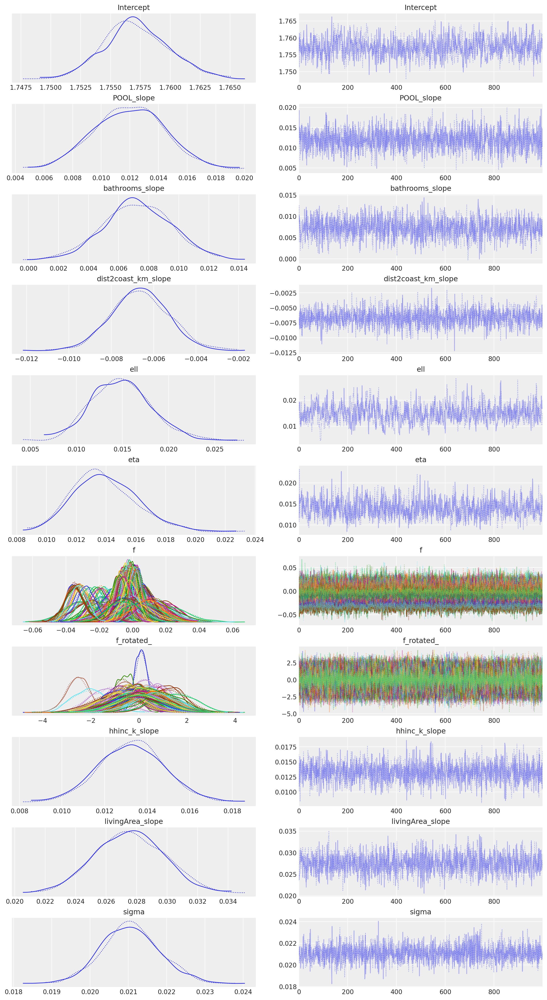

In [ ]:
az.plot_trace(idata_gaussian)

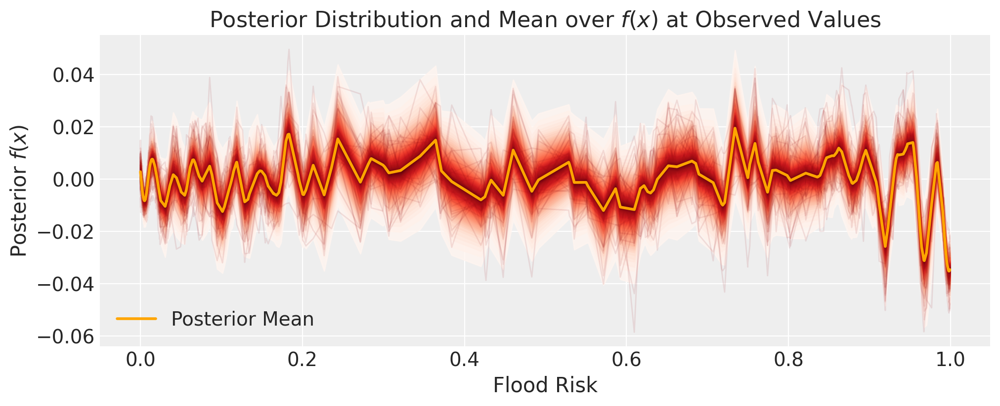

In [ ]:
# plot the samples from the gp posterior with samples and shading
from pymc.gp.util import plot_gp_dist

f_post = az.extract(idata_gaussian, var_names="f").transpose("sample", ...)

# Convert flood risk to NumPy array and sort it
flood_risk = np.array(st_pete_property_mod.flood_risk).reshape(-1, 1)
sorted_indices = np.argsort(flood_risk.flatten())  # Get sorted indices
flood_risk_sorted = flood_risk[sorted_indices]  # Sort flood risk values
f_post_sorted = f_post[:, sorted_indices]  # Sort f(x) posterior accordingly

# Compute the mean of the posterior samples (sorted)
f_mean_sorted = f_post_sorted.mean(dim="sample")

# Create figure and axis
fig = plt.figure(figsize=(10, 4))
ax = fig.gca()

# Plot the sorted posterior distribution
plot_gp_dist(ax, f_post_sorted, flood_risk_sorted)

# Overlay the sorted posterior mean
ax.plot(flood_risk_sorted, f_mean_sorted, color="orange", lw=2, label="Posterior Mean")

# Labels and title
plt.xlabel("Flood Risk")
plt.ylabel("Posterior $f(x)$")
plt.title("Posterior Distribution and Mean over $f(x)$ at Observed Values")
plt.legend()

# Show the plot
plt.show()

In [ ]:
f_post = az.extract(idata_gaussian, var_names="f").transpose("sample", ...)
f_mean = f_post.mean(dim="sample")
flood_risk = np.array(st_pete_property_mod.flood_risk).reshape(-1, 1)
gaussian_effect_by_flood_risk = pd.DataFrame(
    {"flood_risk": flood_risk.flatten(), "gaussian_effect": f_mean.values.flatten(),
     "lat": st_pete_property_mod.latitude.values, "lon": st_pete_property_mod.longitude.values}
)

In [ ]:
gaussian_effect_by_flood_risk.to_csv('/content/drive/MyDrive/why_people_stay/gaussian_effect_by_flood_risk.csv')

In [ ]:
# check Rhat, values above 1 may indicate convergence issues
n_nonconverged = int(
    np.sum(az.rhat(idata_gaussian)[["eta", "ell", "sigma", "f_rotated_"]].to_array() > 1.03).values
)
if n_nonconverged == 0:
    print("No Rhat values above 1.03, \N{check mark}")
else:
    print(f"The MCMC chains for {n_nonconverged} RVs appear not to have converged.")

No Rhat values above 1.03, ✓


<Axes: xlabel='y'>

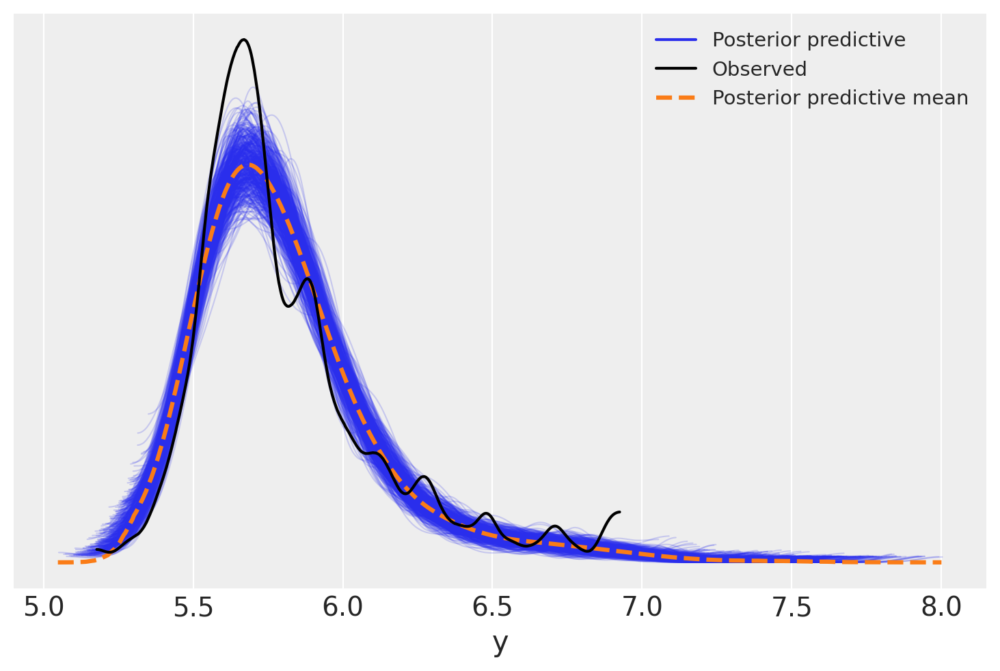

In [ ]:
az.plot_ppc(idata_gaussian, num_pp_samples=500)

In [ ]:
idata_experiment = idata_gaussian.copy()

In [ ]:
idata_gaussian.posterior_predictive.y.mean(dim=["chain", "draw"])

<xarray.DataArray 'y' (y_dim_0: 478)> Size: 4kB
array([5.56683976, 6.00407186, 5.57328057, 5.59830269, 5.60870646,
       5.86436576, 5.67762326, 5.61686023, 5.60393969, 5.72772703,
       5.9689696 , 5.65899415, 6.08794904, 6.06336134, 5.61598941,
       5.60010969, 5.74044518, 5.93016478, 5.65986295, 5.93752314,
       5.58623731, 5.7317789 , 5.55792021, 6.90421237, 5.74362061,
       5.64278015, 5.80478301, 5.55759733, 5.58510363, 5.69701451,
       5.55294277, 5.76661812, 5.89137043, 5.5906441 , 5.56625638,
       5.74497579, 5.57684282, 5.54068384, 5.85933881, 5.75793556,
       5.96750009, 5.61191217, 5.45105013, 5.46496498, 5.57349086,
       5.70947333, 5.76050491, 5.81159771, 5.66608695, 5.58252095,
       5.95597011, 5.60354802, 5.61760247, 5.72863779, 5.93776169,
       5.70465218, 5.95375786, 5.6817263 , 5.86328243, 5.65329874,
       5.89745389, 5.60045788, 5.58436353, 5.7032106 , 5.68024911,
       5.59266629, 5.81536861, 5.82166684, 5.92537647, 5.42231689,
       5.79610723, 5.66936018, 5.74094672, 5.74787752, 5.90398366,
       5.93876131, 5.82746107, 5.70980416, 5.63985446, 5.813468  ,
       5.55694838, 5.84807669, 5.6105581 , 5.68127515, 5.43309763,
       5.77244429, 5.61004101, 5.63287612, 5.63925573, 5.78029272,
       5.63005661, 5.71194192, 5.69873336, 5.68420099, 5.83153636,
       5.87860198, 5.55501338, 6.01208458, 5.83895426, 5.73690135,
...
       5.7766785 , 5.52233802, 5.8199864 , 5.51652589, 5.65917165,
       5.59498478, 5.52966437, 5.6670732 , 5.77610253, 5.458398  ,
       6.08119698, 6.53357256, 6.65695208, 6.75316771, 5.63199809,
       5.73643335, 5.83079585, 6.11035211, 6.2425326 , 5.70100874,
       5.82216754, 6.7580882 , 5.56132462, 6.32003972, 5.69003394,
       5.58752148, 6.22354806, 5.70239109, 5.59268282, 5.53788768,
       5.82641749, 5.67901923, 5.85429632, 5.99899611, 5.70537736,
       5.50367744, 5.63990143, 5.7646926 , 6.27426474, 5.82159065,
       5.66583442, 5.69436056, 5.53426077, 6.51537321, 5.67037995,
       5.59762748, 5.64909088, 5.86611589, 5.73499332, 5.69249067,
       6.27858486, 6.57112124, 5.71482263, 5.60571411, 5.76770691,
       5.98226685, 5.95205727, 5.59804669, 5.8363399 , 5.5414127 ,
       6.05776951, 5.84426067, 5.62374606, 5.64192254, 6.92656117,
       5.55095784, 5.61217503, 5.56483127, 5.46800964, 5.87230674,
       5.77232995, 5.88730969, 5.54056337, 5.47457113, 5.73768629,
       6.15022933, 5.70180107, 5.69479206, 5.56816331, 5.64833968,
       5.74344663, 5.57008966, 5.5918657 , 7.11309977, 5.67855727,
       5.64292764, 6.293736  , 6.2090961 , 6.18035807, 5.65594755,
       5.79118007, 6.00854034, 5.67583172, 6.9183946 , 5.94795263,
       5.814351  , 6.2479774 , 6.04446524])
Coordinates:
  * y_dim_0  (y_dim_0) int64 4kB 0 1 2 3 4 5 6 7 ... 471 472 473 474 475 476 477

In [ ]:
n_new = 10
X_new = np.linspace(-0.99, 0.99, n_new)[:, None]


# This doesn't work:
# with gaussian_model:
#     # add the GP conditional to the model, given the new X values
#     f_pred = gp.conditional("f_pred", X_new, jitter=1e-4)

#     # Sample from the GP conditional distribution
#     idata_experiment.extend(pm.sample_posterior_predictive(idata_experiment, var_names=["f_pred"]))

In [ ]:
# Make new predictions for the gaussian part
with gaussian_model:
    f_pred = gp.conditional("f_pred", X_new, jitter=1e-4)
    idata_f_pred = pm.sample_posterior_predictive(
        idata_experiment, var_names=["f_pred"]
    )

Output()

In [ ]:
idata_f_pred

Inference data with groups:
	> posterior_predictive
	> observed_data

### Narrow down area of interest

In [ ]:
property_venetian = gpd.read_file('/content/drive/MyDrive/why_people_stay/property_east_shore/property_venetian.shp').drop(columns='geometry')
property_shoreacre = gpd.read_file('/content/drive/MyDrive/why_people_stay/property_east_shore/property_shoreacre.shp').drop(columns='geometry')
property_snellisle = gpd.read_file('/content/drive/MyDrive/why_people_stay/property_east_shore/property_snellisle.shp').drop(columns='geometry')

In [ ]:
property_venetian.columns

Index(['field_1', 'zpid', 'streetAddr', 'zipcode', 'city', 'state', 'latitude',
       'longitude', 'price', 'bathrooms', 'bedrooms', 'livingArea',
       'YEAR_BUILT', 'EFFECTIVE_', 'COOLING', 'HEATING', 'POOL', 'TENNIS',
       'CONTAMINAT', 'EVAC_ZONE', 'WATERFRONT', 'SEAWALL', 'GEOID', 'hhinc_k',
       'flood_risk', 'MC_std', 'dist2coast', 'grocery_ac'],
      dtype='object')

In [ ]:
for df in [property_venetian, property_shoreacre, property_snellisle]:
    df['lg_price'] = np.log10(df.price)
    df['dist2coast_km'] = df['dist2coast']/1000

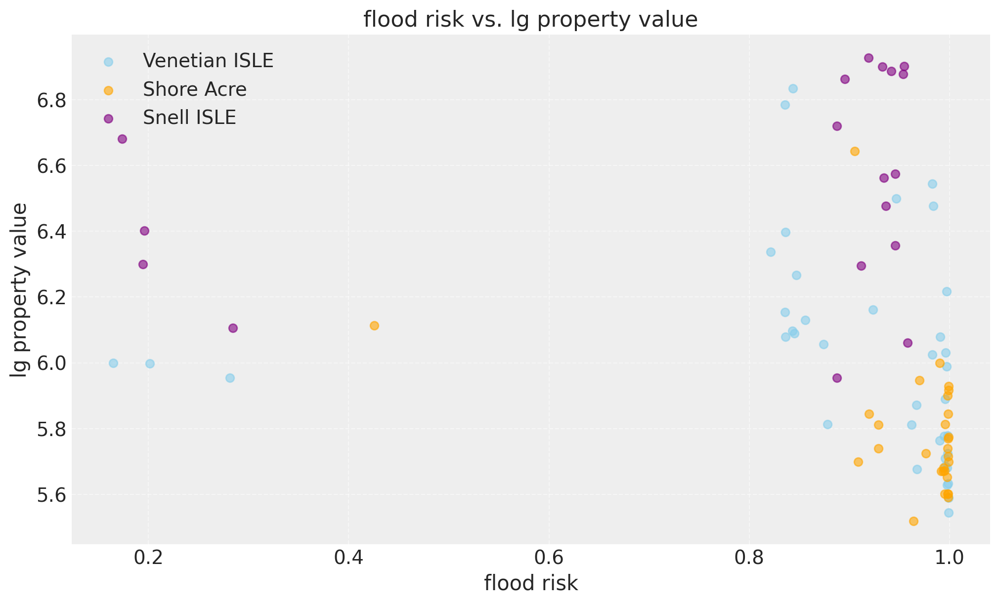

In [ ]:
# Define colors for each dataset
colors = ['skyblue', 'orange', 'purple']

# Create a scatter plot
plt.figure(figsize=(10, 6))

plt.scatter(property_venetian['flood_risk'], property_venetian['lg_price'], color=colors[0], label='Venetian ISLE', alpha=0.6)
plt.scatter(property_shoreacre['flood_risk'], property_shoreacre['lg_price'], color=colors[1], label='Shore Acre', alpha=0.6)
plt.scatter(property_snellisle['flood_risk'], property_snellisle['lg_price'], color=colors[2], label='Snell ISLE', alpha=0.6)

# Labels and title
plt.xlabel('flood risk')
plt.ylabel('lg property value')
plt.title('flood risk vs. lg property value')

# Show legend
plt.legend()

# Show grid
plt.grid(True, linestyle='--', alpha=0.5)

# Display the plot
plt.show()


### Compare neighborhood-level prediction: Focusing on Shore Acre, Venetian Isle and Snell Isle

In [ ]:
# ['lg_price', 'bathrooms', 'livingArea', 'POOL', 'hhinc_k', 'flood_risk', 'dist2coast_km']
# ['lg_price', 'bathrooms', 'livingArea', 'POOL', 'EVAC_ZONE', 'hhinc_k', 'dist2coast_km']
st_pete_property_ds = st_pete_property_df[['zpid', 'lg_price', 'bathrooms', 'livingArea', 'POOL', 'EVAC_ZONE', 'hhinc_k', 'flood_risk', 'dist2coast_km','WATERFRONT_YN', 'tract_idx']].dropna().reset_index(drop=True)

In [ ]:
property_east_neighbor = pd.concat([property_venetian, property_shoreacre, property_snellisle])[['zpid', 'lg_price', 'bathrooms', 'livingArea', 'POOL', 'EVAC_ZONE', 'hhinc_k', 'flood_risk', 'dist2coast_km','WATERFRONT']].dropna().reset_index(drop=True)

In [ ]:
property_east_shore_idx = st_pete_property_ds[st_pete_property_ds.zpid.isin(property_east_neighbor.zpid)].index

In [ ]:
property_east_shore_idx

Index([ 12,  23,  39,  50,  58,  60,  67,  70,  73,  88,  98, 106, 108, 110,
       118, 125, 132, 135, 139, 155, 161, 162, 163, 167, 168, 174, 180, 187,
       191, 194, 214, 225, 231, 234, 236, 240, 250, 267, 269, 272, 282, 285,
       287, 304, 305, 308, 311, 312, 314, 317, 324, 325, 326, 328, 331, 335,
       340, 348, 350, 360, 362, 376, 377, 378, 382, 391, 392, 396, 397, 398,
       401, 407, 411, 417, 418, 419, 429, 432, 434, 444, 450, 463, 464, 474,
       475],
      dtype='int64')

In [ ]:
base_post_pred_east_neighbor = idata_base.posterior_predictive.y.isel(y_dim_0=property_east_shore_idx)

In [ ]:
base_post_pred_east_neighbor

<xarray.DataArray 'y' (chain: 4, draw: 1000, y_dim_0: 85)> Size: 3MB
[340000 values with dtype=float64]
Coordinates:
  * chain    (chain) int64 32B 0 1 2 3
  * draw     (draw) int64 8kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
  * y_dim_0  (y_dim_0) int64 680B 12 23 39 50 58 60 ... 444 450 463 464 474 475

In [ ]:
# Stack chain and draw into a single 'sample' dimension
stacked = base_post_pred_east_neighbor.stack(sample=("chain", "draw"))

# Randomly choose 500 samples
np.random.seed(11)  # For reproducibility
sampled_draws = stacked.isel(sample=np.random.choice(stacked.sample.size, 500, replace=False))

In [ ]:
ppc_mean = base_post_pred_east_neighbor.mean(dim=["chain", "draw"])
ppc_mean

<xarray.DataArray 'y' (y_dim_0: 85)> Size: 680B
array([5.98767957, 6.88181856, 5.89185933, 5.96011189, 6.0149092 ,
       6.05392945, 5.84859303, 5.94103209, 5.85676006, 5.76143116,
       5.97069673, 5.83454683, 5.81559036, 6.03881412, 6.01581465,
       6.16591573, 5.8422616 , 5.90587872, 6.19812971, 6.12818226,
       5.84716163, 5.93665728, 5.81259663, 6.03428406, 5.7630401 ,
       5.9665416 , 6.0787819 , 5.94472096, 6.06695367, 6.01275081,
       5.98181617, 5.93751968, 5.92606835, 6.43052382, 5.8642746 ,
       6.27567223, 6.42493836, 6.38780425, 6.21295443, 6.00923103,
       6.07453215, 5.94634364, 5.96818487, 5.87946527, 5.86709204,
       6.05705493, 6.35302365, 5.86548448, 6.04382506, 5.9440113 ,
       7.70741357, 6.07739787, 5.80554167, 6.23348984, 6.49454862,
       5.97667732, 6.02384102, 5.76437042, 6.65768763, 6.63268822,
       6.00468446, 6.35269612, 6.78006222, 5.92031041, 5.85849737,
       6.41698551, 6.53962667, 5.95724106, 6.12496618, 6.18745997,
       6.66522609, 5.81481776, 5.80360931, 5.8306657 , 6.17061842,
       5.79354852, 5.74317914, 5.84115115, 5.90374023, 6.88499902,
       5.8477226 , 7.01900099, 5.78873418, 5.87318439, 5.93415504])
Coordinates:
  * y_dim_0  (y_dim_0) int64 680B 12 23 39 50 58 60 ... 444 450 463 464 474 475

<ipython-input-66-ff4c7052174c>:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


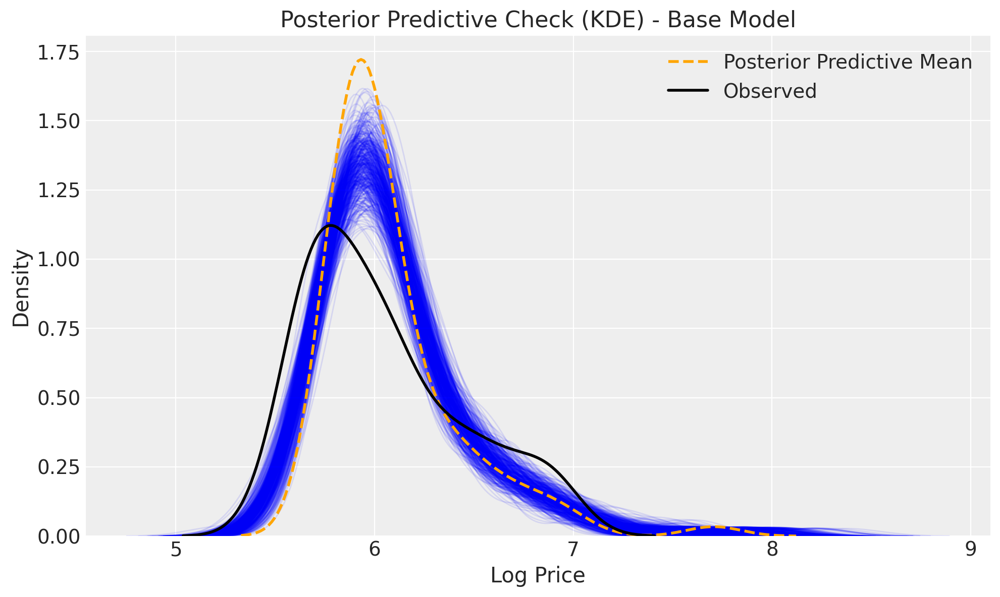

In [ ]:
# For line-only KDEs
plt.figure(figsize=(10, 6))

# Sampled posterior predictive KDEs (500 draws across y_dim_0)
for i in range(sampled_draws.sample.size):
    sns.kdeplot(sampled_draws.isel(sample=i).values, color='blue', alpha=0.1, linewidth=1)

# Loop over the 500 sampled draws (from draw dimension)
# for i in range(sampled_draws.draw.size):
#     sns.kdeplot(sampled_draws.isel(draw=i).values, color='blue', alpha=0.1, linewidth=1)

# Posterior predictive mean KDE
sns.kdeplot(ppc_mean.values, color='orange', linewidth=2, linestyle='--', label='Posterior Predictive Mean')

# Observed values KDE
sns.kdeplot(property_east_neighbor.lg_price, color='black', linewidth=2, label='Observed')

plt.legend()
plt.title("Posterior Predictive Check (KDE) - Base Model")
plt.xlabel("Log Price")
plt.ylabel("Density")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
gaussian_post_pred_east_neighbor = idata_gaussian.posterior_predictive.y.isel(y_dim_0=property_east_shore_idx)

In [ ]:
# Stack chain and draw into a single 'sample' dimension
gaussian_stacked = gaussian_post_pred_east_neighbor.stack(sample=("chain", "draw"))

# Randomly choose 500 samples
np.random.seed(11)  # For reproducibility
gaussian_sampled_draws = gaussian_stacked.isel(sample=np.random.choice(gaussian_stacked.sample.size, 500, replace=False))

In [ ]:
gaussian_ppc_mean = gaussian_post_pred_east_neighbor.mean(dim=["chain", "draw"])

<ipython-input-69-0b9d39c78d87>:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


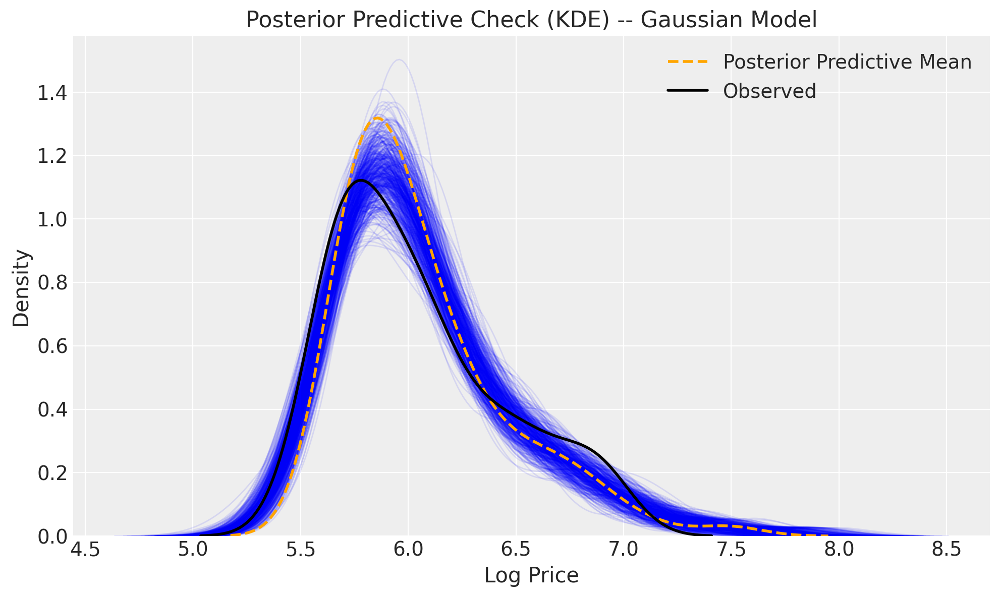

In [ ]:
# For line-only KDEs
plt.figure(figsize=(10, 6))

# Sampled posterior predictive KDEs (500 draws across y_dim_0)
for i in range(gaussian_sampled_draws.sample.size):
    sns.kdeplot(gaussian_sampled_draws.isel(sample=i).values, color='blue', alpha=0.1, linewidth=1)

# Loop over the 500 sampled draws (from draw dimension)
# for i in range(gaussian_sampled_draws.draw.size):
#     sns.kdeplot(gaussian_sampled_draws.isel(draw=i).values, color='blue', alpha=0.1, linewidth=1)

# Posterior predictive mean KDE
sns.kdeplot(gaussian_ppc_mean.values, color='orange', linewidth=2, linestyle='--', label='Posterior Predictive Mean')

# Observed values KDE
sns.kdeplot(property_east_neighbor.lg_price, color='black', linewidth=2, label='Observed')

plt.legend()
plt.title("Posterior Predictive Check (KDE) -- Gaussian Model")
plt.xlabel("Log Price")
plt.ylabel("Density")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
fld_zone_post_pred_east_neighbor = idata_fld_zone.posterior_predictive.y.isel(y_dim_0=property_east_shore_idx)

In [ ]:
# Stack chain and draw into a single 'sample' dimension
fld_zone_stacked = fld_zone_post_pred_east_neighbor.stack(sample=("chain", "draw"))

# Randomly choose 500 samples
np.random.seed(11)  # For reproducibility
fld_zone_sampled_draws = fld_zone_stacked.isel(sample=np.random.choice(fld_zone_stacked.sample.size, 500, replace=False))

In [ ]:
fld_zone_ppc_mean = fld_zone_post_pred_east_neighbor.mean(dim=["chain", "draw"])

<ipython-input-73-7576d66d7086>:22: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


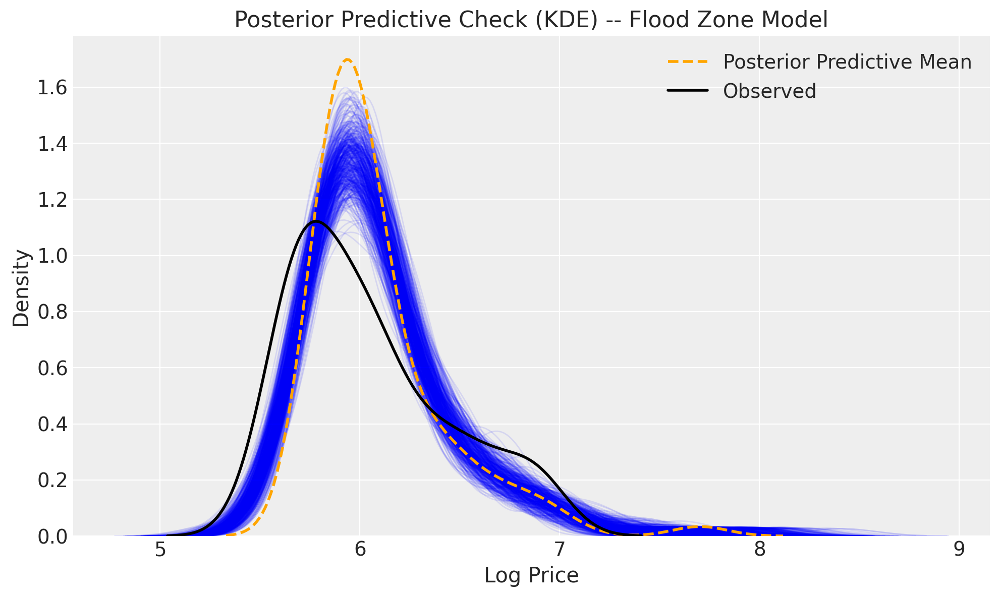

In [ ]:
# For line-only KDEs
plt.figure(figsize=(10, 6))

# Sampled posterior predictive KDEs (500 draws across y_dim_0)
for i in range(fld_zone_sampled_draws.sample.size):
    sns.kdeplot(fld_zone_sampled_draws.isel(sample=i).values, color='blue', alpha=0.1, linewidth=1)

# for i in range(fld_zone_sampled_draws.draw.size):
#     sns.kdeplot(fld_zone_sampled_draws.isel(draw=i).values, color='blue', alpha=0.1, linewidth=1)

# Posterior predictive mean KDE
sns.kdeplot(fld_zone_ppc_mean.values, color='orange', linewidth=2, linestyle='--', label='Posterior Predictive Mean')

# Observed values KDE
sns.kdeplot(property_east_neighbor.lg_price, color='black', linewidth=2, label='Observed')

plt.legend()
plt.title("Posterior Predictive Check (KDE) -- Flood Zone Model")
plt.xlabel("Log Price")
plt.ylabel("Density")
plt.grid(True)
plt.tight_layout()
plt.show()
